#Όραση Υπολογιστών - Εαρινό εξάμηνο 2021
$1^ο$ Εργαστήριο Όρασης Υπολογιστών \
Θέμα: *Εντοπισμός Σημείων Ενδιαφέροντος και Εξαγωγή Χαρακτηριστικών σε Εικόνες* \
Ευάγγελος Γεωργακίλας (03116047) \
Μιχαέλα Αικατερίνη Κωνσταντίνου (03117004)

## Imports

In [ ]:
!pip install opencv-python==3.4.2.17 opencv-contrib-python==3.4.2.17

In [ ]:
!pip install varname

In [ ]:
from IPython.html.widgets import *
import cv2
import numpy as np
import matplotlib.pyplot as plt
import scipy
import math
from varname import nameof

##Βοηθητικός κώδικας $2^{ου}$ μέρους
Περιεχόμενο του αρχείου `cv21_lab1_part2_utils.py`

In [4]:
import sys
from matplotlib.patches import Circle

def interest_points_visualization(I_, kp_data_, ax=None):
    '''
    Plot keypoints chosen by detectos on image.
    Args:
        I_: Image (if colored, make sure it is in RGB and not BGR).
        kp_data_: Nx3 array, as described in assignment.
        ax: Matplotlib axis to plot on (if None, a new Axes object is created).
    Returns:
        ax: Matplotlib axis where the image was plotted.
    '''
    try:
        I = np.array(I_)
        kp_data = np.array(kp_data_)
    except:
        print('Conversion to numpy arrays failed, check if the inputs (image and keypoints) are in the required format.')
        exit(2)

    try:
        assert(len(I.shape) == 2 or (len(I.shape) == 3 and I.shape[2] == 3))
    except AssertionError as e:
        print('interest_points_visualization: Image must be either a 2D matrix or a 3D matrix with the last dimension having size equal to 3.', file=sys.stderr)
        exit(2)

    try:
        assert(len(kp_data.shape) == 2 and kp_data.shape[1] == 3)
    except AssertionError as e:
        print('interest_points_visualization: kp_data must be a 2D matrix with 3 columns.', file=sys.stderr)
        exit(2)

    if ax is None:
        _, ax = plt.subplots()

    ax.set_aspect('equal')
    ax.imshow(I)
    ax.tick_params(bottom=False, left=False, labelbottom=False, labelleft=False)

    for i in range(len(kp_data)):
        x, y, sigma = kp_data[i]
        circ = Circle((x, y), 3*sigma, edgecolor='g', fill=False, linewidth=2)
        ax.add_patch(circ)

    return ax

def disk_strel(n):
    '''
        Return a structural element, which is a disk of radius n.
    '''
    r = int(np.round(n))
    d = 2*r+1
    x = np.arange(d) - r
    y = np.arange(d) - r
    x, y = np.meshgrid(x,y)
    strel = x**2 + y**2 <= r**2
    return strel.astype(np.uint8)

## Μέρος 1: Ανίχνευση Ακμών σε Γκρίζες Εικόνες

### 1.1. Δημιουργία Εικόνων Εισόδου

#### 1.1.1 Διάβασμα εικόνων

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [6]:
I_0 = cv2.imread('/content/drive/MyDrive/ECE/Σ/ComputerVision/Lab1/cv21_lab1_part1&2_material/edgetest_10.png', cv2.IMREAD_GRAYSCALE)
I_0 = I_0.astype(np.float)/255 #normalization

>Τύπωμα με χρήση matplotlib πακέτου

In [ ]:
fig = plt.figure(figsize = (10,5))
#Reverse gray scale 
plt.subplot(1, 2, 1)
plt.imshow(I_0, cmap = 'gray_r')
#Regular gray scale
plt.subplot(1, 2, 2)
plt.imshow(I_0, cmap = 'gray')

>Τύπωμα με χρήση cv2 πακέτου (για το Colab)

In [9]:
from google.colab.patches import cv2_imshow

In [ ]:
 cv2_imshow(I_0*255) 

#### 1.1.2 Δημιουργία θορύβου
$$PSNR = 20log_{10}(\frac{I_{max}- I_{min}}{σ_n}) \Rightarrow$$
$$\frac{PSNR}{20} = log_{10}(\frac{I_{max}- I_{min}}{σ_n}) \Rightarrow$$
$$10^{\frac{PSNR}{20}} = \frac{I_{max}- I_{min}}{σ_n}\Rightarrow$$
$${σ_n} = \frac{I_{max}- I_{min}}{10^{\frac{PSNR}{20}}}$$
----

In [11]:
def noiseSigma(Imax, Imin, PSNR):
  return (Imax - Imin) / 10**(PSNR/20)

In [12]:
#Για PSNR = 20dB
sigma_n_20 = noiseSigma(I_0.max(), I_0.min(), PSNR = 20)
#Για PSNR = 10dB
sigma_n_10 = noiseSigma(I_0.max(), I_0.min(), PSNR = 10)

>*Ελάττωση του PSNR αντιστοιχεί σε αύξηση των επιπέδων θορύβου της εικόνας.*
Αφού ${10^{\frac{PSNR}{20}}}$ μειώνεται άρα $σ_n$ αυξάνεται

In [13]:
#Generate white noise for 20dB
n_20 = np.random.normal(loc = 0.0, scale = sigma_n_20, size = I_0.shape)
#Generate white noise for 10dB
n_10 = np.random.normal(loc = 0.0, scale = sigma_n_10, size = I_0.shape)

In [14]:
#Combine I_0 image with white noise (sigma = sigma_n_20, PSNR = 20dB)
I_0_20 = I_0 + n_20
#Combine I_0 image with white noise (sigma = sigma_n_10, PSNR = 10dB)
I_0_10 = I_0 + n_10

In [15]:
def addNoise(img, PSNR = 20):
  # img = np.array(img)
  sigma_n = noiseSigma(img.max(), img.min(), PSNR)
  n = np.random.normal(loc = 0.0, scale = sigma_n_20, size = I_0.shape)
  return img+n

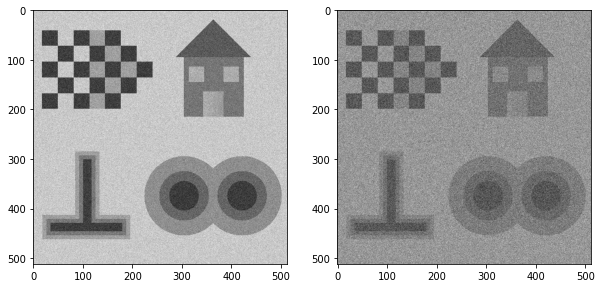

In [16]:
fig = plt.figure(figsize = (10,5))
plt.subplot(1, 2, 1)
plt.imshow(I_0_20, cmap = 'gray')

plt.subplot(1, 2, 2)
plt.imshow(I_0_10, cmap = 'gray')

>Πράγματι βλέπουμε πως με μείωση του PSNR έχουμε αύξηση του θορύβου

#### Clipping
Προκειμένου να μπορούμε να μελετήσουμε τις εικόνες και να μειώσουμε συστηματικά λίγο το θόρυβο εφαρμοζουμε clipping. Εφόσον έχουμε κάνει κανονικοποίηση παίρνουμε για ακραίες τιμές το 0,1.

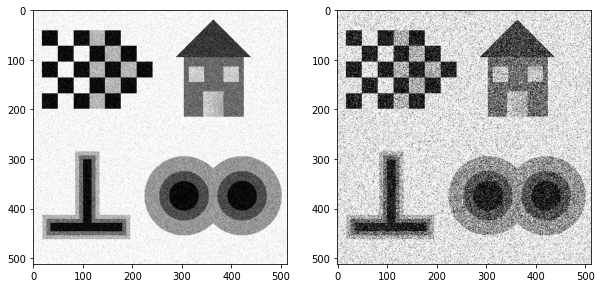

In [17]:
I_0_20 = np.clip(I_0_20, 0, 1)
I_0_10 = np.clip(I_0_10, 0, 1)
fig = plt.figure(figsize = (10,5))
plt.subplot(1, 2, 1)
plt.imshow(I_0_20, cmap = 'gray')

plt.subplot(1, 2, 2)
plt.imshow(I_0_10, cmap = 'gray')

### 1.2. Υλοποίηση Αλγορίθμων Ανίχνευσης Ακμών

#### 1.2.1 Κρουστικές αποκρίσεις διακριτών γραμμικών φίλτρων

Όσο το *σ* αυξάνεται, οι λεπτομέρειες της εικόνας "θολώνουν" κι ετσι δεν λαμβάνονται υποψιν στην εξαγωγή τον ακμών της εικόνας. Με αυτόν τον τρόπο μπορούμε να επικεντρωθούμε σε αντικείμενα μεγάλης κλίμακας αλλά χάνουμε την λεπτομέρεια της εικόνας. Αυτό οφείλεται στο γεγονός πως η Gaussian είναι επιθυμητό να προσεγγίζει μια δ-Dirac και κάτι τέτοιο είναι εφικτό μέσο επιλογής μικρού *σ*. 
Θα δοκιμάσουμε διάφορες τιμές για το *σ*



*   Διδιάστατη Gaussian $G_σ(x,y)$



In [18]:
def gauss2D(n,s):
  """Returns 2D gaussian kernel with sigma = s and kernel_size = n = 6*s+1"""
  gauss_1D = cv2.getGaussianKernel(n,s)
  return gauss_1D @ gauss_1D.T

In [19]:
def G_smoothing(img,n=None,s=None):
  if n is None:
    n = int(2*np.ceil(3*s)+1)
  g_filter = gauss2D(n,s)
  return cv2.filter2D(img, -1, g_filter)

Text(0.5, 0.98, 'PSNR = 10dB')

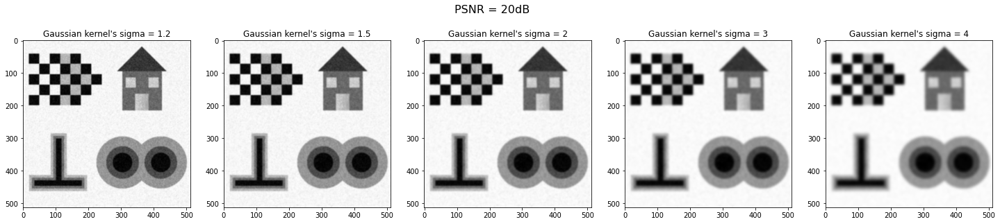

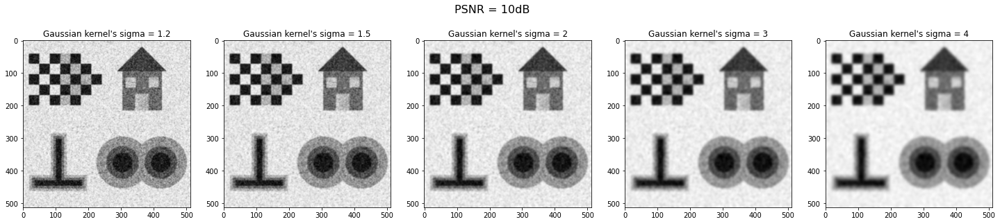

In [20]:
sigma = [1.2, 1.5, 2, 3, 4]
n = [int(np.ceil(3*s)*2+1) for s in sigma]
# G_kernels = [gauss2D(n,s) for s, n in zip(sigma, n)]
# G_smoothed_20 = [cv2.filter2D(I_0_20, -1, filter) for filter in G_kernels]
# G_smoothed_10 = [cv2.filter2D(I_0_10, -1, filter) for filter in G_kernels]

G_smoothed_20 = [G_smoothing(I_0_20,n,s) for s,n in zip(sigma,n)]
G_smoothed_10 = [G_smoothing(I_0_10,n,s) for s,n in zip(sigma,n)]


#For PSNR = 20dB
fig, axes = plt.subplots(1, 5, figsize=(25,5))
for idx, (img, ax) in enumerate(zip(G_smoothed_20,axes)):
  ax.imshow(img, cmap = 'gray')
  ax.set_title(f"Gaussian kernel's sigma = {sigma[idx]}")
fig.suptitle('PSNR = 20dB', fontsize=16)
#For PSNR = 10dB
fig, axes = plt.subplots(1, 5, figsize=(25,5))
for idx, (img, ax) in enumerate(zip(G_smoothed_10,axes)):
  ax.imshow(img, cmap = 'gray')
  ax.set_title(f"Gaussian kernel's sigma = {sigma[idx]}")
fig.suptitle('PSNR = 10dB', fontsize=16)

*      Laplacian-of-Gaussian (LoG) $h(x, y) = ∇^2G_σ(x, y)$

Διακριτή παραγώγιση 2 φορες -> προσθήκη θορύβου

In [21]:
def laplacianOfGaussian(sigma, n):
  """Returns 2D LoG kernel for sigma = sigma and size = nxn"""
  ax = np.linspace(-n//2, n//2, n)
  x, y = np.meshgrid(ax, ax)
  kernel = np.exp(-(x**2+y**2)/(2*sigma**2)) / (2*np.pi*sigma**4) * ((x**2+y**2)/sigma**2 - 2)
  #kernel = (1/(np.pi*sigma**4))*np.exp(-(x**2+y**2)/(2*sigma**2))*(((x**2+y**2)/(2*sigma**2))-1)
  return kernel

In [22]:
def LoG_conv(img,s,n):
  """Returns the convolution of the image(img) with a 2D LoG kernel for sigma = sigma and size = nxn"""
  LoG_kernel = laplacianOfGaussian(s,n)
  return cv2.filter2D(img, -1, LoG_kernel)

Text(0.5, 0.98, 'PSNR = 10dB')

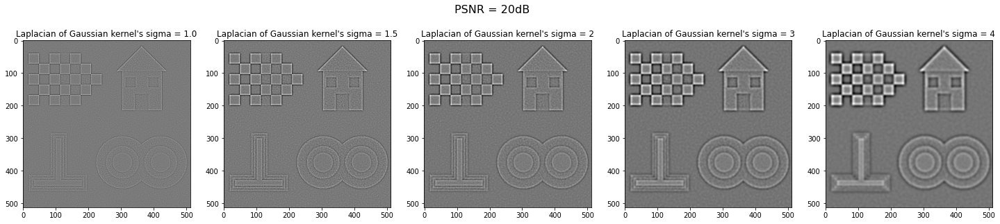

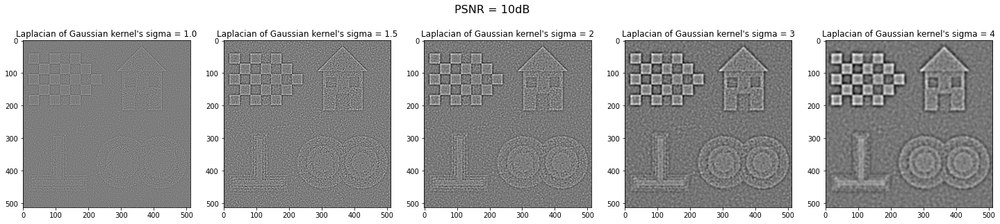

In [23]:
sigma = [1.0, 1.5, 2, 3, 4]
n = [int(np.ceil(3*s)*2+1) for s in sigma]
LoG_kernels = [laplacianOfGaussian(s,n) for s, n in zip(sigma, n)]
  
LoG_smoothed_20 = [cv2.filter2D(I_0_20, -1, filter) for filter in LoG_kernels]
LoG_smoothed_10 = [cv2.filter2D(I_0_10, -1, filter) for filter in LoG_kernels]


#For PSNR = 20dB
fig, axes = plt.subplots(1, 5, figsize=(25,5))
for idx, (img, ax) in enumerate(zip(LoG_smoothed_20,axes)):
  ax.imshow(img, cmap = 'gray')
  ax.set_title(f"Laplacian of Gaussian kernel's sigma = {sigma[idx]}")
fig.suptitle('PSNR = 20dB', fontsize=16)
#For PSNR = 10dB
fig, axes = plt.subplots(1, 5, figsize=(25,5))
for idx, (img, ax) in enumerate(zip(LoG_smoothed_10,axes)):
  ax.imshow(img, cmap = 'gray')
  ax.set_title(f"Laplacian of Gaussian kernel's sigma = {sigma[idx]}")
fig.suptitle('PSNR = 10dB', fontsize=16)

In [24]:
def laplacianOfGaussian2(sigma, n):
  """Returns 2D LoG kernel for sigma = sigma and size = nxn"""
  ax = np.arange(-n//2,n//2+1)
  x, y = np.meshgrid(ax, ax)  
  nom = ( (y**2)+(x**2)-2*(sigma**2) )
  denom = ( (2*np.pi*(sigma**6) ))
  expo = np.exp( -((x**2)+(y**2))/(2*(sigma**2)) )
  return nom*expo/denom

Text(0.5, 0.98, 'PSNR = 10dB')

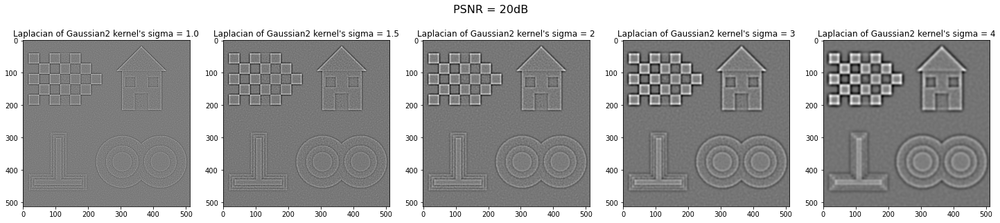

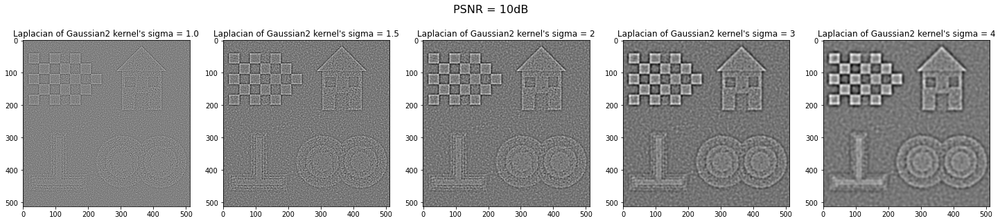

In [25]:
sigma = [1.0, 1.5, 2, 3, 4]
n = [int(np.ceil(3*s)*2+1) for s in sigma]
LoG_kernels2 = [laplacianOfGaussian2(s,n) for s, n in zip(sigma, n)]
  
LoG_smoothed_202 = [cv2.filter2D(I_0_20, -1, filter) for filter in LoG_kernels2]
LoG_smoothed_102 = [cv2.filter2D(I_0_10, -1, filter) for filter in LoG_kernels2]


#For PSNR = 20dB
fig, axes = plt.subplots(1, 5, figsize=(25,5))
for idx, (img, ax) in enumerate(zip(LoG_smoothed_202,axes)):
  ax.imshow(img, cmap = 'gray')
  ax.set_title(f"Laplacian of Gaussian2 kernel's sigma = {sigma[idx]}")
fig.suptitle('PSNR = 20dB', fontsize=16)
#For PSNR = 10dB
fig, axes = plt.subplots(1, 5, figsize=(25,5))
for idx, (img, ax) in enumerate(zip(LoG_smoothed_102,axes)):
  ax.imshow(img, cmap = 'gray')
  ax.set_title(f"Laplacian of Gaussian2 kernel's sigma = {sigma[idx]}")
fig.suptitle('PSNR = 10dB', fontsize=16)

####Lossy LoG

In [26]:
def lossylaplacianOfGaussian(sigma):
    laplacian = np.array([[ 0,-1, 0],
                           [-1, 4,-1],
                           [ 0,-1, 0]])
    n = int(2*np.ceil(3*sigma)+1)
    gauss_2D = gauss2D(n,sigma)
    log = cv2.filter2D(gauss_2D, -1, laplacian)
    return log

In [27]:
def lossyLoG_conv(img,s):
  """Returns the convolution of the image(img) with a 2D LoG kernel for sigma = sigma and size = nxn"""
  LoG_kernel = lossylaplacianOfGaussian(s)
  return cv2.filter2D(img, -1, LoG_kernel)

In [ ]:
lossyLoG_kernels = [lossylaplacianOfGaussian(s) for s in sigma]
  
lossyLoG_smoothed_20 = [cv2.filter2D(I_0_20, -1, filter) for filter in lossyLoG_kernels]
lossyLoG_smoothed_10 = [cv2.filter2D(I_0_10, -1, filter) for filter in lossyLoG_kernels]


#For PSNR = 20dB
fig, axes = plt.subplots(1, 5, figsize=(25,5))
for idx, (img, ax) in enumerate(zip(lossyLoG_smoothed_20,axes)):
  ax.imshow(img, cmap = 'gray')
  ax.set_title(f"Lossy Laplacian of Gaussian kernel's sigma = {sigma[idx]}")
fig.suptitle('PSNR = 20dB', fontsize=16)
#For PSNR = 10dB
fig, axes = plt.subplots(1, 5, figsize=(25,5))
for idx, (img, ax) in enumerate(zip(lossyLoG_smoothed_10,axes)):
  ax.imshow(img, cmap = 'gray')
  ax.set_title(f"Lossy Laplacian of Gaussian kernel's sigma = {sigma[idx]}")
fig.suptitle('PSNR = 10dB', fontsize=16)

#### 1.2.2 Non linear approximation of Laplacian with morphology filters

In [29]:
def non_linear_Laplacian(img):
  B = np.array([[0,1,0],[1,1,1],[0,1,0]], dtype=np.uint8)
  erosion = cv2.erode(img, B)      #(-)
  dilation = cv2.dilate(img, B)    #(+)
  return dilation+erosion-2*img

Text(0.5, 0.98, 'PSNR = 10dB')

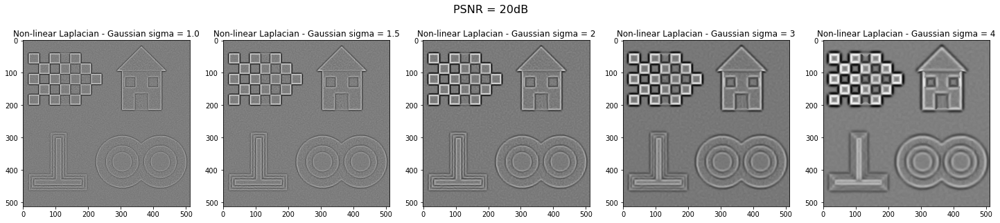

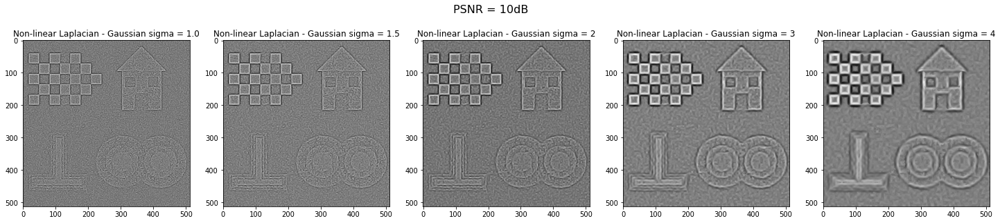

In [30]:
non_linear_20 = [non_linear_Laplacian(img_20) for img_20 in G_smoothed_20]
non_linear_10 = [non_linear_Laplacian(img_10) for img_10 in G_smoothed_10]

#For PSNR = 20dB
fig, axes = plt.subplots(1, 5, figsize=(25,5))
for idx, (img, ax) in enumerate(zip(non_linear_20,axes)):
  ax.imshow(img, cmap = 'gray')
  ax.set_title(f"Non-linear Laplacian - Gaussian sigma = {sigma[idx]}")
fig.suptitle('PSNR = 20dB', fontsize=16)
#For PSNR = 10dB
fig, axes = plt.subplots(1, 5, figsize=(25,5))
for idx, (img, ax) in enumerate(zip(non_linear_10,axes)):
  ax.imshow(img, cmap = 'gray')
  ax.set_title(f"Non-linear Laplacian - Gaussian sigma = {sigma[idx]}")
fig.suptitle('PSNR = 10dB', fontsize=16)

#### 1.2.3 Zero-crossing

In [31]:
def image_outline(img_out):
  kernel = np.array([[0,1,0],[1,1,1],[0,1,0]], dtype=np.uint8)
  erosion = cv2.erode(img_out, kernel)      #(-)
  dilation = cv2.dilate(img_out, kernel)    #(+)
  return dilation-erosion

In [32]:
def zerocrossing(img_zc):
  _, zc = cv2.threshold(img_zc, 0, 1, cv2.THRESH_BINARY)
  Y = image_outline(zc)
  zerocrossing_img = np.zeros(Y.shape)
  zerocrossing_img[Y == 1] = 1
  return zerocrossing_img

##### LoG

Text(0.5, 0.98, 'Zerocrossing - PSNR = 10dB')

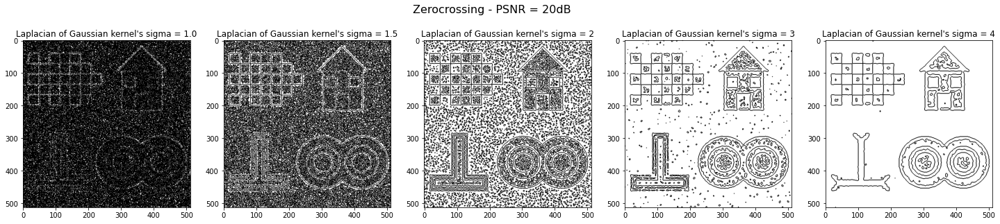

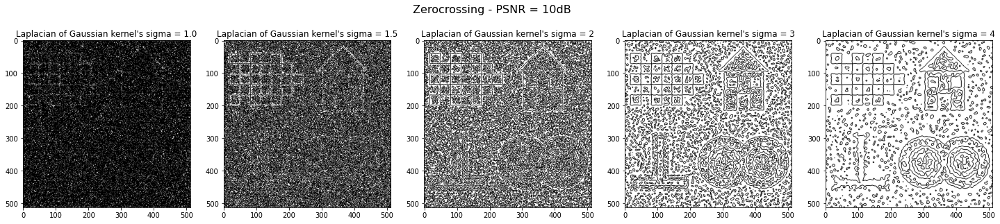

In [33]:
#LoG_smoothed_20 -> PSNR = 20dB
#LoG_smoothed_10 -> PSNR = 10dB

zerocross_LoG_20 = [zerocrossing(img) for img in LoG_smoothed_20]
zerocross_LoG_10 = [zerocrossing(img) for img in LoG_smoothed_10]

#For PSNR = 20dB
fig, axes = plt.subplots(1, 5, figsize=(25,5))
for idx, (img, ax) in enumerate(zip(zerocross_LoG_20,axes)):
  ax.imshow(img, cmap = 'gray_r')
  ax.set_title(f"Laplacian of Gaussian kernel's sigma = {sigma[idx]}")
fig.suptitle('Zerocrossing - PSNR = 20dB', fontsize=16)
#For PSNR = 10dB
fig, axes = plt.subplots(1, 5, figsize=(25,5))
for idx, (img, ax) in enumerate(zip(zerocross_LoG_10,axes)):
  ax.imshow(img, cmap = 'gray_r')
  ax.set_title(f"Laplacian of Gaussian kernel's sigma = {sigma[idx]}")
fig.suptitle('Zerocrossing - PSNR = 10dB', fontsize=16)

#####Lossy LoG

In [ ]:
lossyzerocross_LoG_20 = [zerocrossing(img) for img in lossyLoG_smoothed_20]
lossyzerocross_LoG_10 = [zerocrossing(img) for img in lossyLoG_smoothed_10]

#For PSNR = 20dB
fig, axes = plt.subplots(1, 5, figsize=(25,5))
for idx, (img, ax) in enumerate(zip(lossyzerocross_LoG_20,axes)):
  ax.imshow(img, cmap = 'gray_r')
  ax.set_title(f"lossy Laplacian of Gaussian kernel's sigma = {sigma[idx]}")
fig.suptitle('Zerocrossing - PSNR = 20dB', fontsize=16)
#For PSNR = 10dB
fig, axes = plt.subplots(1, 5, figsize=(25,5))
for idx, (img, ax) in enumerate(zip(lossyzerocross_LoG_10,axes)):
  ax.imshow(img, cmap = 'gray_r')
  ax.set_title(f"lossy Laplacian of Gaussian kernel's sigma = {sigma[idx]}")
fig.suptitle('Zerocrossing - PSNR = 10dB', fontsize=16)

##### Non linear Laplacian

Text(0.5, 0.98, 'Zerocrossing - PSNR = 10dB')

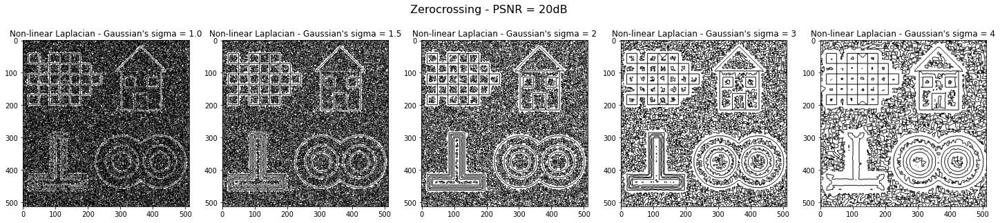

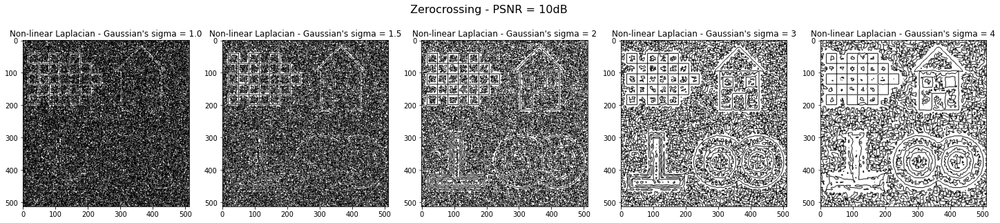

In [35]:
#non_linear_20 -> PSNR = 20dB
#non_linear_10 -> PSNR = 10dB


zerocross_nonlin_20 = [zerocrossing(zcimg) for zcimg in non_linear_20]
zerocross_nonlin_10 = [zerocrossing(zcimg) for zcimg in non_linear_10]


#For PSNR = 20dB
fig, axes = plt.subplots(1, 5, figsize=(25,5))
for idx, (img, ax) in enumerate(zip(zerocross_nonlin_20,axes)):
  ax.imshow(img, cmap = 'gray_r')
  ax.set_title(f"Non-linear Laplacian - Gaussian's sigma = {sigma[idx]}")
fig.suptitle('Zerocrossing - PSNR = 20dB', fontsize=16)
#For PSNR = 10dB
fig, axes = plt.subplots(1, 5, figsize=(25,5))
for idx, (img, ax) in enumerate(zip(zerocross_nonlin_10,axes)):
  ax.imshow(img, cmap = 'gray_r')
  ax.set_title(f"Non-linear Laplacian - Gaussian's sigma = {sigma[idx]}")
fig.suptitle('Zerocrossing - PSNR = 10dB', fontsize=16)

#### 1.2.4 Threshold - Gradient

In [36]:
def threshold(img_s, img, theta = 0.2):
  gradientx, gradienty = np.gradient(img_s)
  gradient = (gradientx**2+gradienty**2)**0.5
  G = np.zeros(img_s.shape)
  G[gradient>theta*gradient.max()] = 1
  return img.astype(int) & G.astype(int)

#####LoG

Text(0.5, 0.98, 'Threshold - PSNR = 10dB')

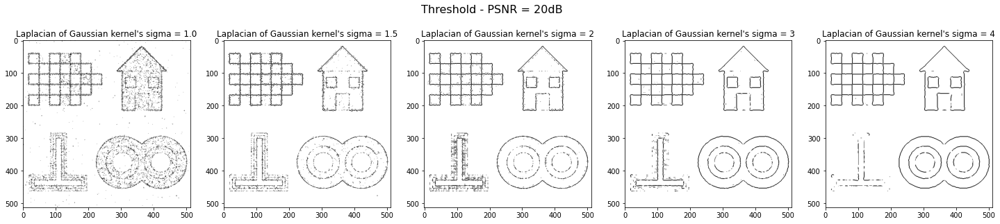

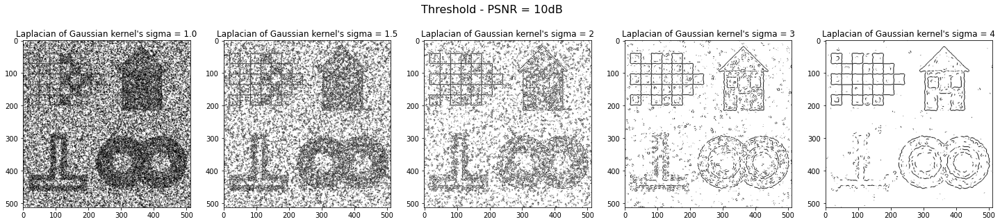

In [37]:
threshold_LoG_20 = [threshold(img_s,img, 0.2) for img_s,img in zip(LoG_smoothed_20,zerocross_LoG_20)]
threshold_LoG_10 = [threshold(img_s,img, 0.2) for img_s,img in zip(LoG_smoothed_10,zerocross_LoG_10)]

#For PSNR = 20dB
fig, axes = plt.subplots(1, 5, figsize=(25,5))
for idx, (img, ax) in enumerate(zip(threshold_LoG_20,axes)):
  ax.imshow(img, cmap = 'gray_r')
  ax.set_title(f"Laplacian of Gaussian kernel's sigma = {sigma[idx]}")
fig.suptitle('Threshold - PSNR = 20dB', fontsize=16)
#For PSNR = 10dB
fig, axes = plt.subplots(1, 5, figsize=(25,5))
for idx, (img, ax) in enumerate(zip(threshold_LoG_10,axes)):
  ax.imshow(img, cmap = 'gray_r')
  ax.set_title(f"Laplacian of Gaussian kernel's sigma = {sigma[idx]}")
fig.suptitle('Threshold - PSNR = 10dB', fontsize=16)

#####Lossy LoG

In [ ]:
lossythreshold_LoG_20 = [threshold(img_s,img, 0.2) for img_s,img in zip(lossyLoG_smoothed_20,lossyzerocross_LoG_20)]
lossythreshold_LoG_10 = [threshold(img_s,img, 0.2) for img_s,img in zip(lossyLoG_smoothed_10,lossyzerocross_LoG_10)]

#For PSNR = 20dB
fig, axes = plt.subplots(1, 5, figsize=(25,5))
for idx, (img, ax) in enumerate(zip(lossythreshold_LoG_20,axes)):
  ax.imshow(img, cmap = 'gray_r')
  ax.set_title(f"Laplacian of Gaussian kernel's sigma = {sigma[idx]}")
fig.suptitle('Threshold - PSNR = 20dB', fontsize=16)
#For PSNR = 10dB
fig, axes = plt.subplots(1, 5, figsize=(25,5))
for idx, (img, ax) in enumerate(zip(lossythreshold_LoG_10,axes)):
  ax.imshow(img, cmap = 'gray_r')
  ax.set_title(f"Laplacian of Gaussian kernel's sigma = {sigma[idx]}")
fig.suptitle('Threshold - PSNR = 10dB', fontsize=16)

#####Non-linear Laplacian

Text(0.5, 0.98, 'Threshold - PSNR = 10dB')

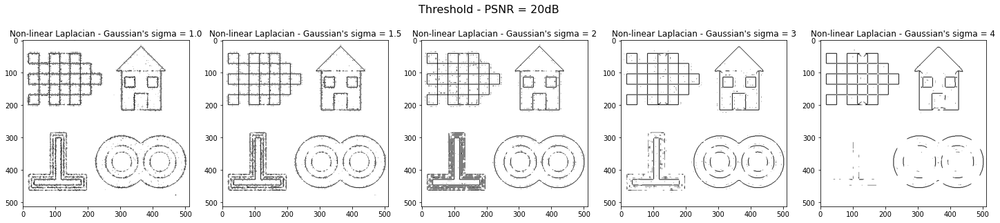

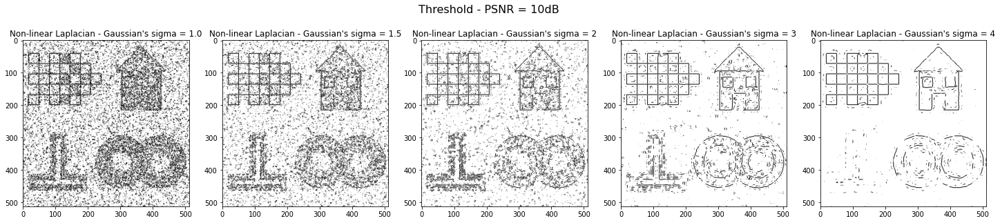

In [172]:
threshold_nonlin_20 = [threshold(img_s, img, 0.2) for img_s,img in zip(non_linear_20,zerocross_nonlin_20)]
threshold_nonlin_10 = [threshold(img_s, img, 0.2) for img_s,img in zip(non_linear_10,zerocross_nonlin_10)]


#For PSNR = 20dB
fig, axes = plt.subplots(1, 5, figsize=(25,5))
for idx, (img, ax) in enumerate(zip(threshold_nonlin_20,axes)):
  ax.imshow(img, cmap = 'gray_r')
  ax.set_title(f"Non-linear Laplacian - Gaussian's sigma = {sigma[idx]}")
fig.suptitle('Threshold - PSNR = 20dB', fontsize=16)
#For PSNR = 10dB
fig, axes = plt.subplots(1, 5, figsize=(25,5))
for idx, (img, ax) in enumerate(zip(threshold_nonlin_10,axes)):
  ax.imshow(img, cmap = 'gray_r')
  ax.set_title(f"Non-linear Laplacian - Gaussian's sigma = {sigma[idx]}")
fig.suptitle('Threshold - PSNR = 10dB', fontsize=16)

###1.2.* EdgeDetect()

In [40]:
def EdgeDetect(img, sigma, theta = 0.2, laplacian_type = 'linear'):
  """Return the edge detection of the image (img), 
  return value: 2D binary image (1 corresponds to edge's pixel)
  sigma(float): Gaussian sigma parameter, recommended value: 1.5 for PSNR = 20dB and 3 for PSNR = 10dB
  theta(float): thresholds value, recolmmended value: 0.2(default)
  laplacian_type: choose between 'linear'(default) and 'non-linear'"""
  imgc = np.clip(img, 0, 1)
  n = int(np.ceil(3*sigma)*2+1)
  if laplacian_type == 'non-linear': #1.2.1 + 1.2.2
    G_smoothed = G_smoothing(imgc, n, sigma)
    smoothed = non_linear_Laplacian(G_smoothed)
  elif laplacian_type == 'linear': #1.2.1
    smoothed = LoG_conv(imgc, sigma, n)
  elif laplacian_type == 'lossylinear':
    smoothed = lossyLoG_conv(imgc, sigma)
  outline = zerocrossing(smoothed) #1.2.3
  D = threshold(smoothed, outline, theta)
  return D

In [ ]:
w = interactive(EdgeDetect, img=fixed(I_0_20), sigma=(0.7,4.0,0.05), theta=(0.0, 0.5, 0.005), laplacian_type = fixed('lossylinear'))
display(w)

In [42]:
D_l = EdgeDetect(I_0_20, 3, 0.2, 'linear')
D_nonl = EdgeDetect(I_0_20, 3, 0.2, 'non-linear')

In [ ]:
D_l = EdgeDetect(I_0, 1.4, 0.2, 'linear')
D_nonl = EdgeDetect(I_0, 1.4, 0.2, 'non-linear')
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,5))
ax1.imshow(D_l, cmap = 'gray_r')
ax2.imshow(D_nonl, cmap = 'gray_r')

### 1.3. Αξιολόγηση των Αποτελεσμάτων Ανίχνευσης Ακμών

##### 1.3.1 Υπολογισμός των αληθινών ακμών

In [ ]:
M = image_outline(I_0)
plt.imshow(M, cmap = 'gray_r')

In [ ]:
D = (M > 0.1).astype(int)
plt.imshow(D, cmap = 'gray_r')

In [46]:
def realEdge(img, theta = 0.2):
  """Returns binary image where pixels with value 1 are part of the edges"""
  M = image_outline(img)
  D = (M > theta).astype(int)
  return D

In [47]:
D_real = realEdge(I_0)

#####1.3.2 Evaluation of EdgeDetect()

In [48]:
def evaluation_edgeDetect(img, sigma, theta = 0.2, laplacian_type = 'linear'):
    img_n = addNoise(img)
    D = EdgeDetect(img_n,sigma,theta,laplacian_type) 
    T = realEdge(img,0.2)   
    # Calculate probabilities
    P = np.sum(T*D) # card[DΛT] = card[TΛD]
    P_T = np.sum(T) # card(T)
    P_D = np.sum(D) # card(D)
    C = (P/P_T +P/P_D)/2
    return round(C,4)

In [49]:
evaluation_edgeDetect(I_0, 1.8, 0.2, 'non-linear')

0.8404

In [50]:
evaluation_edgeDetect(I_0, 2.4, 0.15, 'linear')

0.6759

In [51]:
evaluation_edgeDetect(I_0, 1.7, 0.15, 'lossylinear')

0.727

#####1.3.3 Fine tuning of sigma, theta parameters

In [52]:
def edge_grid_search(img, sigma0 = 1.7, theta0 = 0.16, laplacian_type = 'linear'):
  best_s = 0
  best_th = 0
  best_eval = 0
  sigmas_i = [sigma0+0.1*i for i in range(30)]
  thetas_i = [theta0+0.01*j for j in range(20)]
  for sigma_i in sigmas_i:
    for theta_i in thetas_i:
      eval_i = evaluation_edgeDetect(img, sigma_i, theta_i, laplacian_type = laplacian_type)
      if eval_i > best_eval:
        best_eval = eval_i
        best_s = sigma_i
        best_th = theta_i
  return best_s, best_th, best_eval

In [ ]:
s, th, score = edge_grid_search(I_0, 1, 0.1, 'linear')
print(s, th, score)
plt.imshow(EdgeDetect(I_0,s,th,'linear'), cmap = 'gray_r')

2.5 0.17 0.8544


Text(0.5, 1.0, 'Non linear edge detection')

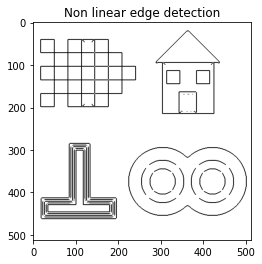

In [54]:
s_non_lin, th_non_lin, score_non_lin = edge_grid_search(I_0, 1.7, 0.1, 'non-linear')
print(s_non_lin, th_non_lin, score_non_lin)
plt.figure()
plt.imshow(EdgeDetect(I_0,s_non_lin,th_non_lin,'non-linear'), cmap = 'gray_r')
plt.title('Non linear edge detection')

In [ ]:
s_lossy, th_lossy, score_lossy = edge_grid_search(I_0, 1.7, 0.1, 'lossylinear')
print(s_lossy, th_lossy, score_lossy)
plt.imshow(EdgeDetect(I_0, s_lossy, th_lossy, 'lossylinear'), cmap = 'gray_r')

### 1.4. Εφαρμογή των Αλγορίθμων Ανίχνευσης Ακμών σε Πραγματικές εικόνες

#####1.4.1 Real image "urban\_edges.jpg"

In [56]:
real_img = cv2.imread('/content/drive/MyDrive/ECE/Σ/ComputerVision/Lab1/cv21_lab1_part1&2_material/urban_edges.jpg', cv2.IMREAD_GRAYSCALE)
real_img = real_img.astype(np.float)/255
D_l = EdgeDetect(real_img, 2, 0.3, 'linear')
D_nonl = EdgeDetect(real_img, 3, 0.1, 'non-linear')

In [57]:
D_real = realEdge(real_img, 0.2)

#####1.4.2 Fine tuning of sigma, theta parameters

In [ ]:
plt.imshow(realEdge(real_img, 0.2), cmap = 'gray_r')

In [59]:
def realevaluation_edgeDetect(img, sigma, theta = 0.2, laplacian_type = 'linear'):
    D = EdgeDetect(img,sigma,theta,laplacian_type) 
    T = realEdge(img, 0.2)   
    # Calculate probabilities
    P = np.sum(T*D) # card[DΛT] = card[TΛD]
    P_T = np.sum(T) # card(T)
    P_D = np.sum(D) # card(D)
    C = (P/P_T +P/P_D)/2
    return round(C,4)

In [60]:
def realedge_grid_search(img, sigma0 = 0.7, theta0 = 0.1, laplacian_type = 'linear'):
  best_s = 0
  best_th = 0
  best_eval = 0
  sigmas_i = [sigma0+0.1*i for i in range(30)]
  thetas_i = [theta0+0.01*j for j in range(25)]
  for sigma_i in sigmas_i:
    for theta_i in thetas_i:
      eval_i = realevaluation_edgeDetect(img, sigma_i, theta_i, laplacian_type = laplacian_type)
      if eval_i > best_eval:
        best_eval = eval_i
        best_s = sigma_i
        best_th = theta_i
  return best_s, best_th, best_eval

In [61]:
s_real_non_lin, th_real_non_lin, score_real_non_lin = realedge_grid_search(real_img, 0, 0, 'non-linear')

In [62]:
print('evaluation score for non linear method: ', score_real_non_lin, f'with sigma = {s_real_non_lin} and threshold = {th_real_non_lin}')

evaluation score for non linear method:  0.7552 with sigma = 0.9 and threshold = 0.15


In [ ]:
plt.figure(figsize=(6,6))
plt.imshow(EdgeDetect(real_img, s_real_non_lin, th_real_non_lin,'non-linear'), cmap = 'gray_r')

In [64]:
s_real_lin, th_real_lin, score_real_lin = realedge_grid_search(real_img)

evaluation score for linear method:  0.6815 with sigma = 1.2 and threshold = 0.15000000000000002


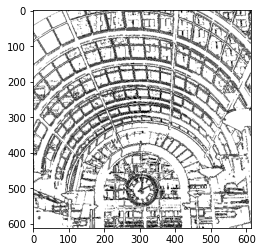

In [65]:
print('evaluation score for linear method: ', score_real_lin, f'with sigma = {s_real_lin} and threshold = {th_real_lin}')
plt.imshow(EdgeDetect(real_img, s_real_lin, th_real_lin,'linear'), cmap = 'gray_r')

In [66]:
s_real_lossy, th_real_lossy, score_real_lossy = realedge_grid_search(real_img, 1.7, 0.1, 'lossylinear')

In [ ]:
print('evaluation score for lossy linear method: ', score_real_lossy, f'with sigma = {s_real_lossy} and threshold = {th_real_lossy}')
plt.imshow(EdgeDetect(real_img, s_real_lossy, th_real_lossy,'lossylinear'), cmap = 'gray_r')

---

## Μέρος 2: Ανίχνευση Σημείων Ενδιαφέροντος (Interest Point Detection)

####Βοηθητικές συναρτήσεις για το $3^ο$ μέρος

In [174]:
def cornersToVisualize_HOG(corn, s):
  border = 0.2 * int(round(5*s)) + 1
  x, y = corn.shape
  idx = np.where(corn == True)
  k_data = np.zeros((len(idx[0]),3))
  for i in range(0,len(idx[0])):
    if idx[1][i] > border and idx[0][i] > border and idx[1][i] < y-border and idx[0][i] < x-border:
      k_data[i,0] = idx[1][i]
      k_data[i,1] = idx[0][i]
      k_data[i,2] = s
  return k_data

###2.1. Ανίχνευση Γωνιών

####2.1.1 Στοιχεία $J_1$, $J_2$ και $J_3$

In [69]:
def computeJs(img, s, rho):
  n = int(np.ceil(3*s)*2+1)
  I_s = G_smoothing(img,n,s)
  I_sx, I_sy = np.gradient(I_s)
  I_xx = I_sx*I_sx
  I_xy = I_sx*I_sy
  I_yy = I_sy*I_sy
  n_r = int(np.ceil(3*rho)*2+1)
  G_r = gauss2D(n_r,rho)
  J1 = cv2.filter2D(I_xx, -1, G_r)
  J2 = cv2.filter2D(I_xy, -1, G_r)
  J3 = cv2.filter2D(I_yy, -1, G_r)
  return J1,J2,J3

In [ ]:
J_1,J_2,J_3 = computeJs(real_img,2,2.5)
fig, axes = plt.subplots(1, 3, figsize=(15,5))
for img, ax in zip((J_1,J_2,J_3),axes):
  ax.imshow(img, cmap = 'gray_r')
  ax.set_title(f"tensor : {nameof(img)}")
fig.suptitle('Elements J1,J2,J3 of tensor J', fontsize=16)

####2.1.2 Ιδιοτιμές $λ_−$, $λ_+$

In [71]:
def lamda_eigenvalues(J1,J2,J3):
  l_plus = 0.5*(J1+J3+np.sqrt((J1-J3)**2 + 4*J2**2))
  l_minus = 0.5*(J1+J3-np.sqrt((J1-J3)**2 + 4*J2**2))
  return l_plus, l_minus

In [ ]:
lp, lm = lamda_eigenvalues(J_1,J_2,J_3)
fig, axes = plt.subplots(1, 2, figsize=(10,5))
for img, ax in zip((lp, lm),axes):
  # ax.imshow(img, cmap = 'gray_r')
  ax.imshow(img, cmap = 'gray')
  ax.set_title(f"eigenvalue : {nameof(img)}")
fig.suptitle('Eigenvalues of tensor J', fontsize=16)

#### 2.1.3 Cornerness Criterion

In [73]:
def cornerness_criterion(lplus, lminus, k):
  return lplus*lminus-k*(lplus+lminus)**2

In [ ]:
R = cornerness_criterion(lp, lm, 0.05)
plt.imshow(R, cmap='gray')

In [75]:
def chooseCorners(R, theta, sigma):
  """returns the corner points of an image by using its corner criterion.
  R is thr corner criterion, k is the small positive constant for the corner criterion,
  theta is the threshold value for corner points and sigma is the scale chosen in the computation of eigenvalues λ-, λ+"""
  ns = np.ceil(3*sigma)*2+1
  B_sq = disk_strel(ns)
  Cond1 = (R == cv2.dilate(R,B_sq))
  Cond2 = (R > R.max()*theta)
  return Cond1 & Cond2

In [76]:
corners = chooseCorners(R, 0.005, 2)

In [ ]:
plt.figure(figsize=(8,8))
plt.imshow(corners, cmap = 'gray')

####2.1.* Cornerss detection in one scale

In [78]:
def cornersDetect(img, sigma, rho, k, theta):
  J_1,J_2,J_3 = computeJs(img,sigma,rho)
  lp, lm = lamda_eigenvalues(J_1,J_2,J_3)
  R = cornerness_criterion(lp, lm, k)
  return chooseCorners(R, theta, sigma)

In [ ]:
corners_vis = cornersDetect(real_img, 2, 2.5, 0.05, 0.005)
plt.imshow(corners_vis, cmap = 'gray')

In [80]:
def cornersToVisualize(corn, s):
  idx = np.where(corn == True)
  k_data = np.zeros((len(idx[0]),3))
  for i in range(0,len(idx[0])):
    k_data[i,0] = idx[1][i]
    k_data[i,1] = idx[0][i]
    k_data[i,2] = s
  return k_data

In [81]:
kd = cornersToVisualize(corners_vis, 2)

In [82]:
r_img = cv2.imread('/content/drive/MyDrive/ECE/Σ/ComputerVision/Lab1/cv21_lab1_part1&2_material/urban_edges.jpg')
r_img = cv2.cvtColor(r_img, cv2.COLOR_BGR2RGB)

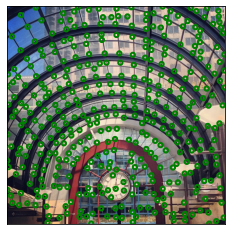

In [83]:
interest_points_visualization(r_img, kd)

###2.2. Πολυκλιμακωτή Ανίχνευση Γωνιών

In [84]:
blood = cv2.imread('/content/drive/MyDrive/ECE/Σ/ComputerVision/Lab1/cv21_lab1_part1&2_material/blood_smear.jpg', cv2.IMREAD_GRAYSCALE)
blood = blood.astype(np.float)/255
blood_r = cv2.imread('/content/drive/MyDrive/ECE/Σ/ComputerVision/Lab1/cv21_lab1_part1&2_material/blood_smear.jpg')
blood_r = cv2.cvtColor(blood_r, cv2.COLOR_BGR2RGB)
mars = cv2.imread('/content/drive/MyDrive/ECE/Σ/ComputerVision/Lab1/cv21_lab1_part1&2_material/mars.png', cv2.IMREAD_GRAYSCALE)
mars = mars.astype(np.float)/255
mars_r = cv2.imread('/content/drive/MyDrive/ECE/Σ/ComputerVision/Lab1/cv21_lab1_part1&2_material/mars.png')
mars_r = cv2.cvtColor(mars_r, cv2.COLOR_BGR2RGB)

In [85]:
def plot_criterion(img, sigma, rho, k):
  J_1,J_2,J_3 = computeJs(img,sigma,rho)
  lp, lm = lamda_eigenvalues(J_1,J_2,J_3)
  R = cornerness_criterion(lp, lm, k)
  plt.imshow(R, cmap = 'gray')

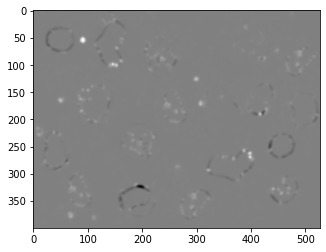

In [86]:
plot_criterion(blood, 2, 2.5, 0.05)

In [ ]:
plot_criterion(blood,6.25, 2.5, 0.05)

In [ ]:
plot_criterion(blood,8, 2.5, 0.05)

####2.2.1 Αλγόριθμος εύρεσης γωνιών μονής κλίμακας

In [89]:
sigma_0 = 2
rho_0 = 2.5
s = 1.5
N = 4
sigmas = [sigma_0*s**i for i in range(N)]
rhos = [rho_0*s**i for i in range(N)]

In [ ]:
corners_sigma = []
for s_i, r_i in zip(sigmas,rhos):
  print(s_i, r_i)
  corner = cornersDetect(blood, s_i, r_i, 0.05, 0.005)
  kp_data = cornersToVisualize(corner, s_i)
  corners_sigma.append(corner)
  interest_points_visualization(blood_r, kp_data)

####2.2.2 Αυτόματη επιλογή χαρακτηριστικής κλίμακας

$|LoG(x,σ_i)|=σ^2_i|L_{xx}(x, σ_i) + L_{yy}(x, σ_i)|, i = 0,...,N−1$ \
όπου $L_{ij} = \frac{∂^2}{∂i∂j}I_σ(x, y)$

In [91]:
def normalizedLoG_conv(img,s):
  """Returns the *normalized* convolution of the image(img) with a 2D LoG kernel for sigma = s"""
  n = int(np.ceil(3*s)*2+1)
  ax = np.linspace(-n//2, n//2, n)
  xx, yy = np.meshgrid(ax, ax)
  r = xx**2+yy**2
  LoG_kernel = np.exp(-r/(2*s**2)) / (2*np.pi*s**4) * (r/s**2 - 2)
  log = cv2.filter2D(img, -1, LoG_kernel)
  return s**2*abs(log)

Η παρακάτω σειριακή υλοποίηση έχει απώλειες λόγω ψηφιακής εικόνας (διακριτή) που εισάγει θόρυβο κατά την (διπλή) παραγώγιση. Η παραπάνω συνάρτηση χρησιμοποιήθηκε η οποία βασίζεται στον τύπο-προϊόν της συνελιξης ενός Laplacian και ενός Gaussian kernel.

In [92]:
def normalizedLoG(v_img, v_sigma):
  """
  Returns |LoG(x,σ)|= σ^2|L_xx(x, σ) + L_yy(x, σ)| where x is the v_img (input image) and σ is the v_sigma (gaussian std - scale)
  """
  v_n = int(np.ceil(3*v_sigma)*2+1)
  vI_s = G_smoothing(v_img,v_n,v_sigma)
  I_sx, I_sy = np.gradient(vI_s)
  L_xx, L_xy = np.gradient(I_sx)
  _, L_yy = np.gradient(I_sy)
  return v_sigma**2*np.abs(L_xx+L_yy)

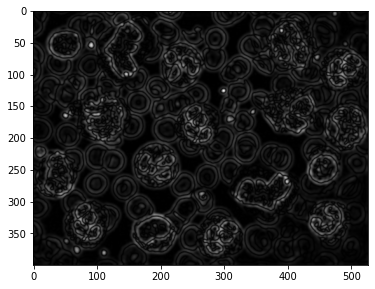

In [93]:
test = normalizedLoG(blood, 2)
plt.figure(figsize=(6,9))
plt.imshow(test, cmap = 'gray')

In [95]:
def argmax(iterable):
    return max(enumerate(iterable), key=lambda x: x[1])[0]

In [96]:
def chooseScale(img, corners, si, sigmas_lst):
  corn = corners.copy()
  log_si = normalizedLoG_conv(img, si)
  j = sigmas_lst.index(si)
  if j!=0:
    log_si0 = normalizedLoG_conv(img, sigmas_lst[j-1])
  else:
    log_si0 = np.zeros(img.shape)
  if j!=len(sigmas_lst)-1:
    log_si2 = normalizedLoG_conv(img, sigmas_lst[j+1])
  else:
    log_si2 = np.zeros(img.shape)
  corn_idx = zip(np.where(corners == True)[0], np.where(corners == True)[1])
  for cx,cy in corn_idx:
    lst = [log_si0[cx,cy], log_si[cx,cy], log_si2[cx,cy]]
    if argmax(lst) != 1:
      corn[cx,cy] = False
  return corn

In [ ]:
for c_img, s_j in zip(corners_sigma,sigmas):
  after_disc_corners = chooseScale(blood, c_img, s_j, sigmas)
  interest_points_visualization(blood_r, cornersToVisualize(c_img, s_j))
  interest_points_visualization(blood_r, cornersToVisualize(after_disc_corners, s_j))

####2.2.* Πολυκλιμακωτή Ανίχνευση Γωνίων

In [98]:
def multiscaleCornerDetect(img, sigmas, rhos, k, theta):
  corners_sigma = [cornersDetect(img, s_i, r_i, k, theta) for s_i, r_i in zip(sigmas,rhos)]
  all_scales = [(chooseScale(img, c_img, s_j, sigmas), s_j) for c_img, s_j in zip(corners_sigma,sigmas)]
  multiscale_corners = np.ndarray(cornersToVisualize(all_scales[0][0], all_scales[0][1]).shape)
  for single_scale, s in all_scales:
    multiscale_corners = np.concatenate((multiscale_corners,cornersToVisualize(single_scale, s)))
  return multiscale_corners

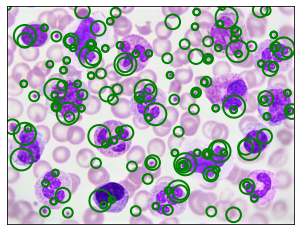

In [99]:
sigmas = [2*1.5**i for i in range(4)]
rhos = [2.5*1.5**i for i in range(4)]
multi = multiscaleCornerDetect(blood, sigmas, rhos, 0.05, 0.005)
interest_points_visualization(blood_r, multi)

In [100]:
def multiscaleCornerDetect_HOG(img, sigmas, rhos, k, theta):
  corners_sigma = [cornersDetect(img, s_i, r_i, k, theta) for s_i, r_i in zip(sigmas,rhos)]
  all_scales = [(chooseScale(img, c_img, s_j, sigmas), s_j) for c_img, s_j in zip(corners_sigma,sigmas)]
  multiscale_corners = np.ndarray(cornersToVisualize_HOG(all_scales[0][0], all_scales[0][1]).shape)
  for single_scale, s in all_scales:
    multiscale_corners = np.concatenate((multiscale_corners,cornersToVisualize_HOG(single_scale, s)))
  return multiscale_corners[~(multiscale_corners==0).all(1)]

###2.3 Ανίχνευση Blobs

####2.3.1. Μερικές παράγωγοι και κριτήριο R

In [102]:
def criterionHessian_lossy(img, sigma):
  n = int(np.ceil(3*sigma)*2+1) 
  I_s = G_smoothing(img,n,sigma)
  I_sx, I_sy = np.gradient(I_s)
  L_xx, L_xy = np.gradient(I_sx)
  _, L_yy = np.gradient(I_sy)
  R = np.zeros((img.shape))
  rows, cols = img.shape
  for x in range(rows):
    for y in range(cols):
      R[x,y] = L_xx[x,y]*L_yy[x,y] - L_xy[x,y]**2
  return R

In [103]:
def criterionHessian(img, sigma):
  """Returns the R array, result: Hessian criterion R = det(H) = Lxx*Lyy - Lxy^2"""
  n = int(np.ceil(3*sigma)*2+1) 
  ax = np.linspace(-n//2, n//2, n)
  x, y = np.meshgrid(ax, ax)
  r = x**2+y**2
  LoG_xx = np.exp(-r/(2*s**2)) / (2*np.pi*s**4) * (x**2/s**2 - 1)
  LoG_yy = np.exp(-r/(2*s**2)) / (2*np.pi*s**4) * (y**2/s**2 - 1)
  Log_xx_yy = LoG_xx + LoG_yy
  LoG_xy = x*y/sigma**4*Log_xx_yy
  L_xx = cv2.filter2D(img, -1, LoG_xx)
  L_xy = cv2.filter2D(img, -1, LoG_xy)
  L_yy = cv2.filter2D(img, -1, LoG_yy)
  return L_xx*L_yy - L_xy**2

####2.3.2. Σημεία ενδιαφέροντος - Τοπικά μέγιστα

In [104]:
def cornersDetect_Blobs(img, sigma, theta):
  R = criterionHessian(img, sigma)
  return chooseCorners(R, theta, sigma)

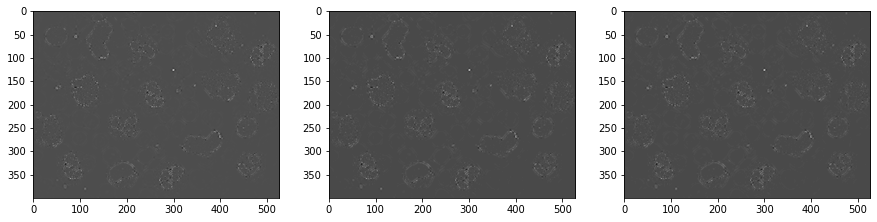

In [105]:
hessian1,hessian2,hessian3 = criterionHessian(blood,2),criterionHessian(blood,8), criterionHessian(blood,6.25)
fig, (ax1,ax2,ax3) = plt.subplots(1, 3, figsize=(15,5))
ax1.imshow(hessian1, cmap = 'gray')
ax2.imshow(hessian2, cmap = 'gray')
ax3.imshow(hessian3, cmap = 'gray')

In [ ]:
corners_vis_blood = cornersDetect_Blobs(blood, 2, 0.005)
plt.imshow(corners_vis_blood, cmap = 'gray')

In [ ]:
kp_d = cornersToVisualize(corners_vis_blood, 2)
interest_points_visualization(blood_r, kp_d)

In [ ]:
corners_vis_mars = cornersDetect_Blobs(mars, 2, 0.005)
kp_d = cornersToVisualize(corners_vis_mars, 2)
interest_points_visualization(mars_r, kp_d)

###2.4. Πολυκλιμακωτή Ανίχνευση Blobs

####2.4.1 Πολυκλιμακωτή Ανίχνευση + Hessian-Laplace

In [110]:
def multiscaleCornerDetect_Blobs(img, sigmas, theta):
  corners_sigma = [cornersDetect_Blobs(img, s_i, theta) for s_i in sigmas]
  all_scales = [(chooseScale(img, c_img, s_j, sigmas), s_j) for c_img, s_j in zip(corners_sigma,sigmas)]
  multiscale_corners = np.ndarray(cornersToVisualize(after_disc_corners, s_j).shape)
  for single_scale, s in all_scales:
    multiscale_corners = np.concatenate((multiscale_corners,cornersToVisualize(single_scale, s)))
  return multiscale_corners

In [ ]:
sigmas = [2*1.5**i for i in range(4)]
multi_mars = multiscaleCornerDetect_Blobs(mars,sigmas,0.018)
interest_points_visualization(mars_r, multi_mars)

In [175]:
def multiscaleCornerDetect_Blobs_HOG(img, sigmas, theta):
  corners_sigma = [cornersDetect_Blobs(img, s_i, theta) for s_i in sigmas]
  all_scales = [(chooseScale(img, c_img, s_j, sigmas), s_j) for c_img, s_j in zip(corners_sigma,sigmas)]
  multiscale_corners = np.ndarray(cornersToVisualize_HOG(all_scales[0][0], all_scales[0][1]).shape)
  for single_scale, s in all_scales:
    multiscale_corners = np.concatenate((multiscale_corners,cornersToVisualize_HOG(single_scale, s)))
  return multiscale_corners[~(multiscale_corners==0).all(1)]

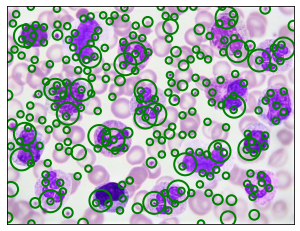

In [157]:
sigmas = [2*1.5**i for i in range(4)]
multi_blood_blobs = multiscaleCornerDetect_Blobs(blood,sigmas,0.005)
interest_points_visualization(blood_r, multi_blood_blobs)

In [ ]:
sigmas = [2*1.5**i for i in range(4)]
multi_blood_blobs = multiscaleCornerDetect_Blobs_HOG(blood,sigmas,0.005)
interest_points_visualization(blood_r, multi_blood_blobs)

###2.5. Επιτάχυνση με την χρήση Box Filters και Ολοκληρωτικών Εικόνων (Integral Images)

####2.5.1 Ολοκληρωτική Εικόνα.

In [115]:
def integral_image(img):
  return img.cumsum(axis=0).cumsum(axis=1)

In [116]:
blood_g = G_smoothing(blood,s=2)

In [ ]:
I_image = integral_image(blood_g)
plt.imshow(I_image, cmap = 'gray_r')

####2.5.2 Υπολογισμός των Lxx, Lxy, Lyy με Box Filters (Dxx, Dxy, Dyy) 

In [118]:
def computeBox(i_img, x, y):
  # A - B + C - D
  return i_img[:-y,:-x] - i_img[:-y,x:] + i_img[y:, x:] - i_img[y:, :-x]

In [119]:
def boxFilter(img, sigma):
  """Returns the result (Lxx, Lxy,Lyy) of application of Dxx, Dxy, Dyy Box filters for a given sigma (used for Gaussian smoothing) 
     on an integral image"""
  n = int(np.ceil(3*sigma)*2 + 1) 
  h = int(4*np.floor(n/6) + 1)
  w = int(2*np.floor(n/6) + 1) 

  npad = 3*w//2 + 1 
  npad_y = h//2 + 1
  # padded = np.pad(img, pad_width = ((npad,npad+1),(npad,npad+1)))
  padded = np.pad(img, pad_width = ((npad,npad_y),(npad,npad_y)))
  i_padded = integral_image(padded)


  npad_ = (3*w - h)//2
  h_2 = h // 2
  i, j = int(np.floor(w/2)+1), int(np.floor(h/2)+1+h_2/2)
  #####################################
  ##  Lxx - white_black_white tile   ##
  #####################################
  Lxx_white = computeBox(i_padded[npad_:-npad_, :-2*w], i, j)
  Lxx_black = computeBox(i_padded[npad_:-npad_, w:-w], i, j)
  Lxx_white2 = computeBox(i_padded[npad_:-npad_, 2*w:], i, j)
  Lxx = Lxx_white - 2*Lxx_black + Lxx_white2

  ####################################
  ##  Lyy - white_black_white tile  ##
  ####################################

  Lyy_white = computeBox(i_padded[:-2*w, npad_:-npad_], j, i)
  Lyy_black = computeBox(i_padded[w:-w, npad_:-npad_], j, i)
  Lyy_white2 = computeBox(i_padded[2*w:, npad_:-npad_], j, i)
  Lyy = Lyy_white - 2*Lyy_black + Lyy_white2

  ############################
  ## Lxy - white_black tile ##
  ##       black_white tile ##
  ############################

  npad_xy = (3*w - 2*w - 1) // 2

  Lxy_white = computeBox(i_padded[npad_xy:-(w+1+npad_xy), npad_xy:-(w+1+npad_xy)], i, i)
  Lxy_black = computeBox(i_padded[npad_xy:-(w+1+npad_xy), w+1+npad_xy:-npad_xy], i, i)
  Lxy_white2 = computeBox(i_padded[w+1+npad_xy:-npad_xy, w+1+npad_xy:-npad_xy], i, i)
  Lxy_black2 = computeBox(i_padded[w+1+npad_xy:-npad_xy, npad_xy:-(w+1+npad_xy)], i, i)
  Lxy = Lxy_white - Lxy_black + Lxy_white2 - Lxy_black2

  return Lxx,Lxy,Lyy

(400, 527) (400, 527) (400, 527)


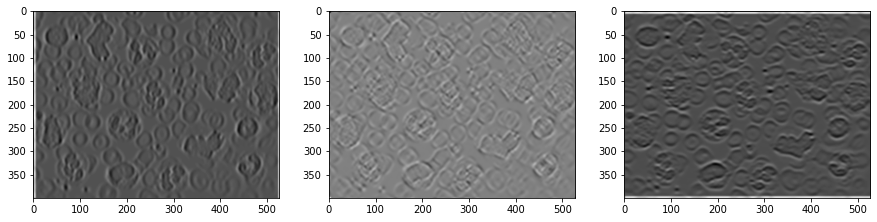

In [120]:
Lxx,Lxy, Lyy = boxFilter(blood_g,2)
print(Lxx.shape, Lyy.shape, Lxy.shape)
fig, (ax1,ax2,ax3) = plt.subplots(1, 3, figsize=(15,5))
ax1.imshow(Lxx, cmap = 'gray_r')
ax2.imshow(Lxy, cmap = 'gray_r')
ax3.imshow(Lyy, cmap = 'gray_r')

In [ ]:
Lxx,Lxy, Lyy = boxFilter(blood_g,6.25)
fig, (ax1,ax2,ax3) = plt.subplots(1, 3, figsize=(15,5))
ax1.imshow(Lxx, cmap = 'gray_r')
ax2.imshow(Lxy, cmap = 'gray_r')
ax3.imshow(Lyy, cmap = 'gray_r')

####2.5.3 Τοπικά Μέγιστα

In [122]:
def criterionBoxFilter(g_img, sigma):
  """Returns the R array, result: Hessian criterion with box filters R = det(H) = Lxx*Lyy - 0.81*Lxy^2"""
  L_xx,L_xy,L_yy = boxFilter(g_img,sigma)
  return L_xx*L_yy - 0.81*L_xy**2

In [ ]:
box1,box2,box3 = criterionBoxFilter(blood_g,2), criterionBoxFilter(blood_g,6.25), criterionBoxFilter(blood_g,8)
fig, (ax1,ax2,ax3) = plt.subplots(1, 3, figsize=(15,5))
ax1.imshow(box1, cmap = 'gray')
ax2.imshow(box2, cmap = 'gray')
ax3.imshow(box3, cmap = 'gray')

In [124]:
def cornersDetect_Box(img, sigma, theta):
  R = criterionBoxFilter(img, sigma)
  return chooseCorners(R, theta, sigma)

In [ ]:
kd = cornersToVisualize(cornersDetect_Box(blood_g, 2, 0.005),2)
interest_points_visualization(blood_r, kd)

####2.5.4 Πολυκλιμακωτή ανίχνευση σημείων ενδιαφέροντος

In [127]:
def multiscaleCornerDetect_BoxFilters(img, sigmas, theta):
  corners_sigma = [cornersDetect_Box(img, s_i, theta) for s_i in sigmas]
  all_scales = [(chooseScale(img, c_img, s_j, sigmas), s_j) for c_img, s_j in zip(corners_sigma,sigmas)]
  multiscale_corners = np.ndarray(cornersToVisualize(after_disc_corners, s_j).shape)
  for single_scale, s in all_scales:
    multiscale_corners = np.concatenate((multiscale_corners,cornersToVisualize(single_scale, s)))
  return multiscale_corners

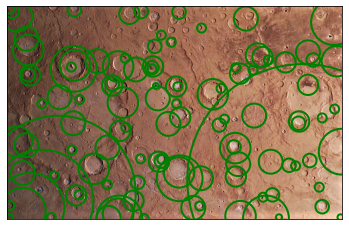

In [131]:
mars_g = G_smoothing(mars,s=2)
sigmas = [1.7*(1.5**i) for i in range(10)]
multi_mars = multiscaleCornerDetect_BoxFilters(mars_g,sigmas,0.018)
interest_points_visualization(mars_r, multi_mars)

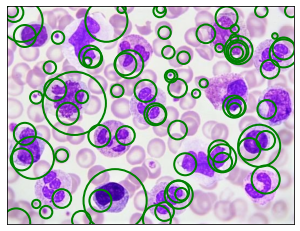

In [177]:
sigmas = [1.7*(1.5**i) for i in range(10)]
multi_blood_box = multiscaleCornerDetect_BoxFilters(blood_g,sigmas,0.018)
interest_points_visualization(blood_r, multi_blood_box)

In [148]:
def multiscaleCornerDetect_BoxFilters_HOG(img, sigmas, theta):
  corners_sigma = [cornersDetect_Box(img, s_i, theta) for s_i in sigmas]
  all_scales = [(chooseScale(img, c_img, s_j, sigmas), s_j) for c_img, s_j in zip(corners_sigma,sigmas)]
  multiscale_corners = np.ndarray(cornersToVisualize_HOG(all_scales[0][0], all_scales[0][1]).shape)
  for single_scale, s in all_scales:
    multiscale_corners = np.concatenate((multiscale_corners,cornersToVisualize_HOG(single_scale, s)))
  return multiscale_corners[~(multiscale_corners==0).all(1)]

---

## Μέρος 3: Εφαρμογές σε Ταίριασμα και Κατηγοριοποίηση Εικόνων με Χρήση Τοπικών Περιγραφητών στα Σημεία Ενδιαφέροντος


In [134]:
%cd ./drive/MyDrive/ECE/Σ/ComputerVision/Lab1/cv21_lab1_part3_material

/content/drive/MyDrive/ECE/Σ/ComputerVision/Lab1/cv21_lab1_part3_material


In [135]:
from cv21_lab1_part3_utils import featuresSURF, featuresHOG, matching_evaluation
from cv21_lab1_part3_utils import createTrainTest, BagOfWords, svm, FeatureExtraction

###3.1. Ταίριασμα Εικόνων υπό Περιστροφή και Αλλαγή Κλίμακας


####3.1.1 Αποτίμηση matching

>Harris detector

In [136]:
sigmas_3 = [0.6, 0.8, 1.0, 1.2]
sigmas_3 = [2*1.5**i for i in range(4)]

In [137]:
sigmas = [1.7*(1.5**i) for i in range(4)]

In [138]:
# Here is a lambda which acts as a wrapper for detector function, e.g. harrisDetector.
# The detector arguments are, in order: image, sigma, rho, k, threshold.
detect_fun = lambda I: cornersToVisualize(cornersDetect(I, 2, 2.5, 0.05, 0.018), 2)

# You can use either of the following lines to extract features (HOG/SURF).
desc_fun = lambda I, kp: featuresSURF(I,kp)
# desc_fun = lambda I, kp: featuresHOG(I,kp)

# Execute evaluation by providing the above functions as arguments
# Returns 2 1x3 arrays containing the errors
avg_scale_errors, avg_theta_errors = matching_evaluation(detect_fun, desc_fun)
for idx, (scale,theta) in enumerate(zip(avg_scale_errors,avg_theta_errors)):
  print('SURF descriptor: Avg. Scale Error for Image {}: {:.3f}'.format(idx+1,scale))
  print('SURF descriptor: Avg. Theta Error for Image {}: {:.3f}'.format(idx+1,theta))

detect_fun = lambda I: cornersToVisualize(cornersDetect(I, 2, 2.5, 0.05, 0.005), 2)
desc_fun = lambda I, kp: featuresHOG(I,kp)
avg_scale_errors, avg_theta_errors = matching_evaluation(detect_fun, desc_fun)
for idx, (scale,theta) in enumerate(zip(avg_scale_errors,avg_theta_errors)):
  print('HOG descriptor: Avg. Scale Error for Image {}: {:.3f}'.format(idx+1,scale))
  print('HOG descriptor: Avg. Theta Error for Image {}: {:.3f}'.format(idx+1,theta))

SURF descriptor: Avg. Scale Error for Image 1: 0.007
SURF descriptor: Avg. Theta Error for Image 1: 2.992
SURF descriptor: Avg. Scale Error for Image 2: 0.002
SURF descriptor: Avg. Theta Error for Image 2: 0.178
SURF descriptor: Avg. Scale Error for Image 3: 0.065
SURF descriptor: Avg. Theta Error for Image 3: 9.314
HOG descriptor: Avg. Scale Error for Image 1: 0.186
HOG descriptor: Avg. Theta Error for Image 1: 22.619
HOG descriptor: Avg. Scale Error for Image 2: 0.351
HOG descriptor: Avg. Theta Error for Image 2: 19.199
HOG descriptor: Avg. Scale Error for Image 3: 0.285
HOG descriptor: Avg. Theta Error for Image 3: 23.699


In [141]:
# Here is a lambda which acts as a wrapper for detector function, e.g. harrisDetector.
# The detector arguments are, in order: image, sigma, rho, k, threshold.
# detect_fun = lambda I: multiscaleCornerDetect(I, 2, 1.5, 0.05, 0.018, 1.5, 4)
detect_fun = lambda I: multiscaleCornerDetect(I, sigmas, rhos, 0.05, 0.018)
# You can use either of the following lines to extract features (HOG/SURF).
desc_fun = lambda I, kp: featuresSURF(I,kp)
# desc_fun = lambda I, kp: featuresHOG(I,kp)

# Execute evaluation by providing the above functions as arguments
# Returns 2 1x3 arrays containing the errors
avg_scale_errors, avg_theta_errors = matching_evaluation(detect_fun, desc_fun)
for idx, (scale,theta) in enumerate(zip(avg_scale_errors,avg_theta_errors)):
  print('SURF descriptor: Avg. Scale Error for Image {}: {:.3f}'.format(idx+1,scale))
  print('SURF descriptor: Avg. Theta Error for Image {}: {:.3f}'.format(idx+1,theta))


detect_fun = lambda I: multiscaleCornerDetect_HOG(I, sigmas, rhos, 0.05, 0.004)
desc_fun = lambda I, kp: featuresHOG(I,kp)
avg_scale_errors, avg_theta_errors = matching_evaluation(detect_fun, desc_fun)
for idx, (scale,theta) in enumerate(zip(avg_scale_errors,avg_theta_errors)):
  print('HOG descriptor: Avg. Scale Error for Image {}: {:.3f}'.format(idx+1,scale))
  print('HOG descriptor: Avg. Theta Error for Image {}: {:.3f}'.format(idx+1,theta))

SURF descriptor: Avg. Scale Error for Image 1: 0.002
SURF descriptor: Avg. Theta Error for Image 1: 0.119
SURF descriptor: Avg. Scale Error for Image 2: 0.004
SURF descriptor: Avg. Theta Error for Image 2: 0.402
SURF descriptor: Avg. Scale Error for Image 3: 0.002
SURF descriptor: Avg. Theta Error for Image 3: 0.147
HOG descriptor: Avg. Scale Error for Image 1: 0.153
HOG descriptor: Avg. Theta Error for Image 1: 18.688
HOG descriptor: Avg. Scale Error for Image 2: 0.433
HOG descriptor: Avg. Theta Error for Image 2: 26.303
HOG descriptor: Avg. Scale Error for Image 3: 0.197
HOG descriptor: Avg. Theta Error for Image 3: 13.263


>Blobs detector

In [142]:
# Here is a lambda which acts as a wrapper for detector function, e.g. harrisDetector.
# The detector arguments are, in order: image, sigma, rho, k, threshold.
detect_fun = lambda I: cornersToVisualize(cornersDetect_Blobs(I, 2, 0.005), 2)

# You can use either of the following lines to extract features (HOG/SURF).
desc_fun = lambda I, kp: featuresSURF(I,kp)
# desc_fun = lambda I, kp: featuresHOG(I,kp)

# Execute evaluation by providing the above functions as arguments
# Returns 2 1x3 arrays containing the errors
avg_scale_errors, avg_theta_errors = matching_evaluation(detect_fun, desc_fun)
for idx, (scale,theta) in enumerate(zip(avg_scale_errors,avg_theta_errors)):
  print('SURF descriptor: Avg. Scale Error for Image {}: {:.3f}'.format(idx+1,scale))
  print('SURF descriptor: Avg. Theta Error for Image {}: {:.3f}'.format(idx+1,theta))

desc_fun = lambda I, kp: featuresHOG(I,kp)
avg_scale_errors, avg_theta_errors = matching_evaluation(detect_fun, desc_fun)
for idx, (scale,theta) in enumerate(zip(avg_scale_errors,avg_theta_errors)):
  print('HOG descriptor: Avg. Scale Error for Image {}: {:.3f}'.format(idx+1,scale))
  print('HOG descriptor: Avg. Theta Error for Image {}: {:.3f}'.format(idx+1,theta))

SURF descriptor: Avg. Scale Error for Image 1: 0.032
SURF descriptor: Avg. Theta Error for Image 1: 5.529
SURF descriptor: Avg. Scale Error for Image 2: 0.003
SURF descriptor: Avg. Theta Error for Image 2: 0.123
SURF descriptor: Avg. Scale Error for Image 3: 0.012
SURF descriptor: Avg. Theta Error for Image 3: 3.635
HOG descriptor: Avg. Scale Error for Image 1: 0.076
HOG descriptor: Avg. Theta Error for Image 1: 10.897
HOG descriptor: Avg. Scale Error for Image 2: 0.187
HOG descriptor: Avg. Theta Error for Image 2: 16.254
HOG descriptor: Avg. Scale Error for Image 3: 0.235
HOG descriptor: Avg. Theta Error for Image 3: 26.576


In [ ]:
# Here is a lambda which acts as a wrapper for detector function, e.g. harrisDetector.
# The detector arguments are, in order: image, sigma, rho, k, threshold.
detect_fun = lambda I: multiscaleCornerDetect_Blobs(I, sigmas, 0.005)

# You can use either of the following lines to extract features (HOG/SURF).
desc_fun = lambda I, kp: featuresSURF(I,kp)
# desc_fun = lambda I, kp: featuresHOG(I,kp)

# Execute evaluation by providing the above functions as arguments
# Returns 2 1x3 arrays containing the errors
avg_scale_errors, avg_theta_errors = matching_evaluation(detect_fun, desc_fun)
for idx, (scale,theta) in enumerate(zip(avg_scale_errors,avg_theta_errors)):
  print('SURF descriptor: Avg. Scale Error for Image {}: {:.3f}'.format(idx+1,scale))
  print('SURF descriptor: Avg. Theta Error for Image {}: {:.3f}'.format(idx+1,theta))


detect_fun = lambda I: multiscaleCornerDetect_Blobs_HOG(I, sigmas, 0.005)
desc_fun = lambda I, kp: featuresHOG(I,kp)
avg_scale_errors, avg_theta_errors = matching_evaluation(detect_fun, desc_fun)
for idx, (scale,theta) in enumerate(zip(avg_scale_errors,avg_theta_errors)):
  print('HOG descriptor: Avg. Scale Error for Image {}: {:.3f}'.format(idx+1,scale))
  print('HOG descriptor: Avg. Theta Error for Image {}: {:.3f}'.format(idx+1,theta))

>Box filters

In [151]:
# Here is a lambda which acts as a wrapper for detector function, e.g. harrisDetector.
# The detector arguments are, in order: image, sigma, rho, k, threshold.
detect_fun = lambda I: multiscaleCornerDetect_BoxFilters(I,sigmas,0.005)

# You can use either of the following lines to extract features (HOG/SURF).
desc_fun = lambda I, kp: featuresSURF(I,kp)
# desc_fun = lambda I, kp: featuresHOG(I,kp)

# Execute evaluation by providing the above functions as arguments
# Returns 2 1x3 arrays containing the errors
avg_scale_errors, avg_theta_errors = matching_evaluation(detect_fun, desc_fun)
for idx, (scale,theta) in enumerate(zip(avg_scale_errors,avg_theta_errors)):
  print('SURF descriptor: Avg. Scale Error for Image {}: {:.3f}'.format(idx+1,scale))
  print('SURF descriptor: Avg. Theta Error for Image {}: {:.3f}'.format(idx+1,theta))

detect_fun = lambda I: multiscaleCornerDetect_BoxFilters_HOG(I,sigmas,0.005)
desc_fun = lambda I, kp: featuresHOG(I,kp)
avg_scale_errors, avg_theta_errors = matching_evaluation(detect_fun, desc_fun)
for idx, (scale,theta) in enumerate(zip(avg_scale_errors,avg_theta_errors)):
  print('HOG descriptor: Avg. Scale Error for Image {}: {:.3f}'.format(idx+1,scale))
  print('HOG descriptor: Avg. Theta Error for Image {}: {:.3f}'.format(idx+1,theta))

SURF descriptor: Avg. Scale Error for Image 1: 0.640
SURF descriptor: Avg. Theta Error for Image 1: 43.809
SURF descriptor: Avg. Scale Error for Image 2: 0.441
SURF descriptor: Avg. Theta Error for Image 2: 31.284
SURF descriptor: Avg. Scale Error for Image 3: 0.561
SURF descriptor: Avg. Theta Error for Image 3: 54.506
HOG descriptor: Avg. Scale Error for Image 1: 0.235
HOG descriptor: Avg. Theta Error for Image 1: 17.136
HOG descriptor: Avg. Scale Error for Image 2: 0.740
HOG descriptor: Avg. Theta Error for Image 2: 18.379
HOG descriptor: Avg. Scale Error for Image 3: 0.176
HOG descriptor: Avg. Theta Error for Image 3: 24.384


####3.1.2 Σχολιασμός της ικανότητας εκτίμησης

###3.2. Κατηγοριοποίηση Εικόνων

####3.2.1 Εξαγωγή χαρακτηριστικών

In [179]:
# desc_fun = lambda I, kp: featuresSURF(I,kp)
desc_fun = lambda I, kp: featuresHOG(I,kp)

In [161]:
detect_fun = lambda I: multiscaleCornerDetect_HOG(I, sigmas, rhos, 0.05, 0.005)
feats_harris = FeatureExtraction(detect_fun, desc_fun)

Time for feature extraction: 317.382


In [ ]:
detect_fun = lambda I: multiscaleCornerDetect_Blobs_HOG(I, sigmas, 0.005)
feats_blobs = FeatureExtraction(detect_fun, desc_fun)

In [163]:
detect_fun = lambda I: multiscaleCornerDetect_BoxFilters_HOG(I, sigmas, 0.005)
feats_box = FeatureExtraction(detect_fun, desc_fun)

Time for feature extraction: 277.126


####3.2.2 Split dataset and label encode

In [164]:
data_train_harris, label_train_harris, data_test_harris, label_test_harris = createTrainTest(feats_harris, 0)

In [ ]:
data_train_blobs, label_train_blobs, data_test_blobs, label_test_blobs = createTrainTest(feats_blobs, 0)

In [165]:
data_train_box, label_train_box, data_test_box, label_test_box = createTrainTest(feats_box, 0)

####3.2.3 Αναπαράσταση Bag of Visual Words

In [166]:
BOF_tr_harris, BOF_ts_harris = BagOfWords(data_train_harris, data_test_harris)

In [ ]:
BOF_tr_blobs, BOF_ts_blobs = BagOfWords(data_train_blobs, data_test_blobs)

In [167]:
BOF_tr_box, BOF_ts_box = BagOfWords(data_train_box, data_test_box)

####3.2.4 Κατηγοριοποίηση εικόνων

In [168]:
acc_harris, preds_harris, probas_harris = svm(BOF_tr_harris, label_train_harris, BOF_ts_harris, label_test_harris)
print(acc_harris)

0.6482758620689655


In [ ]:
acc_blobs, preds_blobs, probas_blobs = svm(BOF_tr_blobs, label_train_blobs, BOF_ts_blobs, label_test_blobs)
print(acc_blobs)

In [170]:
acc_box, preds_box, probas_box = svm(BOF_tr_box, label_train_box, BOF_ts_box, label_test_box)
print(acc_box)

0.6482758620689655
